# Shared Utils Examples Notebook

This notebook previews the various charts, maps, etc you can make using the functions in [shared utils](https://github.com/cal-itp/data-analyses/tree/main/_shared_utils).

To use `shared_utils`: 

> In the terminal: `cd ..` to be in the `_shared_utils` sub-folder, run `make setup_env`, then `cd` back into your task > sub-folder (e.g., `bus_service_increase` or `example_report`). 

## Functions

In [1]:
import geopandas as gpd
import pandas as pd

from calitp_data_analysis.tables import tbls
from siuba import *

from shared_utils import geography_utils, utils

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(
/tmp/ipykernel_641/1447447944.py:1: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. However, if you are using PyGEOS directly (calling P

### Summary Statistics Table

In [2]:
TABULAR_DATA = ("https://raw.githubusercontent.com/mwaskom/seaborn-data/"
                "master/taxis.csv"
               )
df = pd.read_csv(TABULAR_DATA)
df.head()

,pickup,dropoff,passengers,distance,fare,tip,tolls,total,color,payment,pickup_zone,dropoff_zone,pickup_borough,dropoff_borough
0,2019-03-23 20:21:09,2019-03-23 20:27:24,1,1.60,7.0,2.15,0.0,12.95,yellow,credit card,Lenox Hill West,UN/Turtle Bay South,Manhattan,Manhattan
1,2019-03-04 16:11:55,2019-03-04 16:19:00,1,0.79,5.0,0.00,0.0,9.30,yellow,cash,Upper West Side South,Upper West Side South,Manhattan,Manhattan
2,2019-03-27 17:53:01,2019-03-27 18:00:25,1,1.37,7.5,2.36,0.0,14.16,yellow,credit card,Alphabet City,West Village,Manhattan,Manhattan
3,2019-03-10 01:23:59,2019-03-10 01:49:51,1,7.70,27.0,6.15,0.0,36.95,yellow,credit card,Hudson Sq,Yorkville West,Manhattan,Manhattan
4,2019-03-30 13:27:42,2019-03-30 13:37:14,3,2.16,9.0,1.10,0.0,13.40,yellow,credit card,Midtown East,Yorkville West,Manhattan,Manhattan


In [3]:
group_cols = ["pickup_borough", "payment"]
sum_cols = ["tip", "tolls"]
mean_cols = ["fare"]
count_cols = ["pickup"]
nunique_cols = ["pickup_zone"]

by_borough = geography_utils.aggregate_by_geography(
    df[df.pickup_borough.notna()], 
    group_cols=group_cols,
    sum_cols = sum_cols,
    mean_cols = mean_cols,
    count_cols = count_cols,
    nunique_cols = nunique_cols
)

by_borough

,pickup_borough,payment,tip,tolls,fare,pickup,pickup_zone
0,Manhattan,credit card,10217.55,643.42,11.480182,3839.0,60.0
1,Manhattan,cash,0.00,103.68,10.273085,1397.0,63.0
2,Manhattan,NaN,NaN,NaN,NaN,NaN,NaN
3,Queens,cash,0.00,235.97,19.069549,266.0,24.0
4,Queens,credit card,1997.32,881.63,29.237755,383.0,46.0
5,Bronx,credit card,14.71,77.04,24.904189,74.0,33.0
6,Brooklyn,credit card,370.11,109.44,18.875402,261.0,48.0
7,Brooklyn,cash,0.00,0.00,11.100840,119.0,28.0
8,Brooklyn,NaN,NaN,NaN,NaN,NaN,NaN
9,Queens,NaN,NaN,NaN,NaN,NaN,NaN


### Merge geometry back on after aggregation

In [4]:
# Attach geometry after aggregation
GEOSPATIAL_DATA = "https://data.cityofnewyork.us/api/geospatial/tqmj-j8zm?method=export&format=GeoJSON"
gdf = (gpd.read_file(GEOSPATIAL_DATA)
       .rename(columns = {"boro_name": "pickup_borough"})
      )
gdf

,boro_code,pickup_borough,shape_area,shape_leng,geometry
0,5,Staten Island,1623620725.05,325917.35395,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,2,Bronx,1187174784.85,463179.772813,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."
2,4,Queens,3041418505.55,888199.730955,"MULTIPOLYGON (((-73.82645 40.59053, -73.82642 ..."
3,1,Manhattan,636520502.801,357713.30866,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,3,Brooklyn,1934138258.43,728148.53241,"MULTIPOLYGON (((-73.86327 40.58388, -73.86381 ..."


In [5]:
by_borough2 = pd.merge(
    gdf,
    by_borough,
    on = "pickup_borough",
    how = "inner"
)

print(f"# obs in original df: {len(by_borough)}")
print(f"# obs in merged df: {len(by_borough2)}")

# obs in original df: 11
# obs in merged df: 11


### Export a geodataframe to GCS

In [6]:
GCS_FILE_PATH = "gs://calitp-analytics-data/data-analyses/"
FILE_NAME = "test_geoparquet"
utils.geoparquet_gcs_export(by_borough2, GCS_FILE_PATH, FILE_NAME)

## Charts
You'll have to look at the docs for the specific charting packages for how to construct the chart. But, these examples show how to layer some pre-defined themes with additional colors to get as close to the FiveThirtyEight theme as possible. 

In [7]:
import altair as alt
import altair_saver
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

from shared_utils import geography_utils, styleguide
from shared_utils import calitp_color_palette as cp

In [8]:
TABULAR_DATA = "https://raw.githubusercontent.com/mwaskom/seaborn-data/master/taxis.csv"
df = pd.read_csv(TABULAR_DATA)

In [9]:
df2 = geography_utils.aggregate_by_geography(
    df[(df.payment.notna()) & (df.pickup_borough.notna())], 
    group_cols = ["pickup_borough", "payment"],
    sum_cols = ["passengers", "fare"],
    mean_cols = ["distance"],
    nunique_cols = ["pickup_zone", "dropoff_zone"]
)

df2.head()

,pickup_borough,payment,fare,passengers,distance,dropoff_zone,pickup_zone
0,Manhattan,credit card,44072.42,6016,2.460901,140,60
1,Manhattan,cash,14351.50,2199,2.052212,110,63
2,Queens,cash,5072.50,420,5.279135,87,24
3,Queens,credit card,11198.06,574,9.036292,130,46
4,Bronx,credit card,1842.91,80,6.944865,49,33


### Altair Example

* Altair present themes: https://vega.github.io/vega-themes/
* Rendering in notebook is ok, but saving as PNG loses these chart configurations
* Use function to apply the `fivethirtyeight` theme again

In [10]:
alt.themes.enable("fivethirtyeight")

chart = (alt.Chart(df2)
         .mark_bar()
         .encode(
             x=alt.X("pickup_borough:N", title="Origin Borough"),
             y=alt.Y("sum(fare):Q", title="Total Fares"),
             column = "payment:N",
             color = alt.Color("pickup_borough:N", 
                              scale=alt.Scale(
                                  range=cp.CALITP_DIVERGING_COLORS
                              )
                              )
         )
)

chart = (styleguide.preset_chart_config(chart)
         # Add further tweaks to configuration after
         .properties(width = 100, height = 200, 
                     title="Fares by Payment Type")
        )

# chart.save("../example_report/altair_chart.png")
chart

alt.Chart(...)

### Matplotlib

In [11]:
plt.style.use('fivethirtyeight')

plt.bar("pickup_borough", height="fare", data=df2)
plt.xlabel("Origin Borough")
plt.ylabel("Total Fares")
plt.title("Fares by Borough")
plt.savefig("../example_report/matplotlib_chart.png")
plt.close()

![Matploblib](matplotlib_chart.png)

### Seaborn

* Set the `fivethirtyeight` color palette

In [12]:
sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})

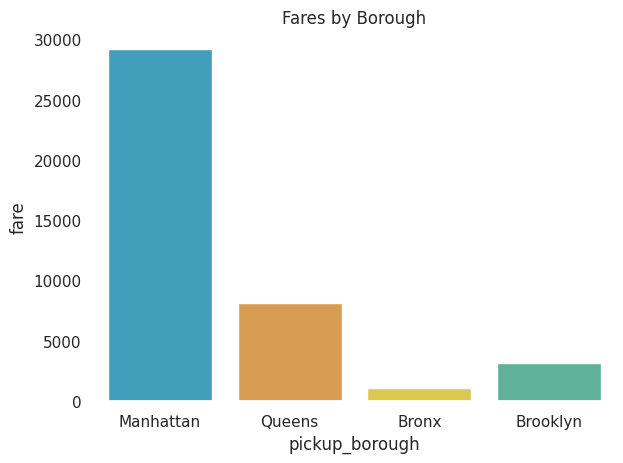

In [13]:
sns_plot = (sns.barplot(x=df2.pickup_borough, y=df2.fare, ci=None, 
                       palette=cp.CALITP_CATEGORY_BRIGHT_COLORS)
            .set_title("Fares by Borough")
           )
chart3 = sns_plot.get_figure()
chart3.tight_layout()
chart3.savefig("../example_report/seaborn_chart.png")

##  Maps

In [14]:
import branca
import geopandas as gpd
import pandas as pd

import shared_utils 

In [15]:
GEOSPATIAL_DATA = ("https://caltrans-gis.dot.ca.gov/arcgis/rest/services/"
       "CHboundary/District_Tiger_Lines/FeatureServer/0/query?"
       "where=1%3D1&objectIds=&time=&geometry=&geometryType=esriGeometryEnvelope&"
       "inSR=&spatialRel=esriSpatialRelIntersects&distance=&units=esriSRUnit_Foot&"
       "relationParam=&outFields=DISTRICT%2C+Region&returnGeometry=true&"
       "maxAllowableOffset=&geometryPrecision=&outSR=&havingClause=&gdbVersion=&"
       "historicMoment=&returnDistinctValues=false&returnIdsOnly=false&"
       "returnCountOnly=false&returnExtentOnly=false&orderByFields=&"
       "groupByFieldsForStatistics=&outStatistics=&returnZ=false&returnM=false&"
       "multipatchOption=xyFootprint&resultOffset=&resultRecordCount=&"
       "returnTrueCurves=false&returnExceededLimitFeatures=false&quantizationParameters=&"
       "returnCentroid=false&sqlFormat=none&resultType=&featureEncoding=esriDefault&"
       "datumTransformation=&f=geojson"
      )

gdf = gpd.read_file(GEOSPATIAL_DATA)

# Create a y-col to map (that's not just District number)
gdf = gdf.assign(
    some_y_col = gdf.index+10
)

gdf.head()

,DISTRICT,Region,geometry,some_y_col
0,1,North,"POLYGON ((-123.51781 42.00076, -123.51793 42.0...",10
1,2,North,"POLYGON ((-122.30409 42.00835, -122.34369 42.0...",11
2,3,North,"POLYGON ((-121.40482 40.13005, -121.40482 40.1...",12
3,4,,"POLYGON ((-122.38960 38.85632, -122.38980 38.8...",13
4,5,Central,"POLYGON ((-121.21407 36.95981, -121.21906 36.9...",14


### CRS 

In [16]:
shared_utils.geography_utils.CA_NAD83Albers

'EPSG:3310'

### Changing the CRS

In [17]:
print(f"original CRS: {gdf.crs}")
gdf = gdf.to_crs(shared_utils.geography_utils.CA_StatePlane)
print(f"new CRS: {gdf.crs}")

original CRS: EPSG:4326
new CRS: EPSG:2229


### Customize Map Color Palette

In [18]:
# Set your own step colormap and specify colors and cut-offs
colorscale = branca.colormap.StepColormap(
                colors=["gray", "green", "navy"], 
                index=[2_000, 4_000, 8_000],
                vmin=0, vmax=15_000,
)

print("Step colorscale, define colors, cut-offs")
display(colorscale)

# Set your own linear colormap and specify colors and cut-offs
colorscale = branca.colormap.LinearColormap(
                colors=["gray", "green", "navy"], 
                index=[2_000, 4_000, 8_000],
                vmin=0, vmax=15_000,
)

print("Linear colorscale, define colors, cut-offs")
display(colorscale)

# Use preset step colormap
colorscale = branca.colormap.step.Accent_03

print("Preset step colorscale")
display(colorscale)

# Use preset linear colormap
colorscale = branca.colormap.linear.Blues_06

print("Preset linear colorscale")
display(colorscale)

colorscale = (branca.colormap.step.Accent_07
              .scale(vmin=gdf.DISTRICT.min(), 
                     vmax=gdf.DISTRICT.max())
             )
print("Preset step colorscale, define min/max")
display(colorscale)

Step colorscale, define colors, cut-offs


Linear colorscale, define colors, cut-offs


Preset step colorscale


Preset linear colorscale


Preset step colorscale, define min/max


In [19]:
'''
# uncomment to see map in the notebook
gdf.explore(
    "DISTRICT", 
    tiles="CartoDB Positron", 
    cmap=branca.colormap.step.Accent_07.scale(
        vmin=gdf.DISTRICT.min(), 
        vmax=gdf.DISTRICT.max())
)
'''

In [20]:
''' 
# uncomment to see map in the notebook
gdf.explore(
    "some_y_col", 
    cmap = "cividis"
)
'''